In [1]:
import pandas as pd
import numpy as np
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn import preprocessing
import random

In [2]:
threshold_mutual_information=0.4  # Take only genes with mutual information more than the threshold

## Generate a list of variables from the PFA anaylsis

In [9]:
# Gene recommendation from PFA and mutual information
genes_mutual_information_label=pd.read_csv('/home2/lumpi/Projects/single-cell_samantha/data/gene_mutual_information.csv').iloc[0:,:]
selected_genes=genes_mutual_information_label[genes_mutual_information_label["mutual information"]>threshold_mutual_information] # Take the genes with more mutual information than the threshold
#selected_genes = selected_genes.iloc[4:5,:]
list_variables=sorted(list(selected_genes["index feature"])) # List of indices of the rows that are to be taken from the data file and correspond to the selected features
list_variables = list(selected_genes["index feature"])

In [10]:
selected_genes

,index feature,mutual information,gene_names
0,162,0.523828,RRM2
1,421,0.506762,H2AZ1


In [11]:
list_variables

[162, 421]

In [12]:
## index correction for list variables
list_variables = [x + 1 for x in list_variables]
list_variables = sorted(list_variables[0:4])
list_variables

[163, 422]

## Generate a list of variables from the pseudotime analysis

In [13]:
# list of gene from other analysis that are interesting in seprating clusters
# ['SERPINE1','TPM1','PMEPA1','TGFBI','COL1A1'])
# [C15orf48, SERPINE1, TPM1, PDGFB, TGFBI, IER3, COL1A1, SPOCK1, MYO10, ADAMTS6, PMEPA1]

In [14]:
import pandas as pd

# Step 1: Read the file into a DataFrame
df_gene_list = pd.read_csv('/home2/lumpi/Projects/single-cell_samantha/data/gene_names.csv')  # Adjust the file path/name as necessary

# Your second list of gene names as a list (converted from string)
gene_names_second_list = ["C15orf48", "SERPINE1", "TPM1", "PDGFB", "TGFBI", "IER3", "COL1A1", "SPOCK1", "MYO10", "ADAMTS6", "PMEPA1"]

# Step 2: Find indices for gene names in the second list
indices = []
found_gene_names = []
for gene in gene_names_second_list:
    index = df_gene_list.index[df_gene_list['gene_names'] == gene].tolist()
    if index:  # If the gene name is found
        indices.extend(index)  # Note: extend is used because index is a list, even if it contains only one element
        found_gene_names.append(gene)

# Step 3: Create a new DataFrame with "index feature", "gene_names", and an empty "mutual information"
df_new = pd.DataFrame({
    "index feature": indices,
    "mutual information": [1] * len(indices),  # Create an column with a value
    "gene_names": found_gene_names
})

# Save the new DataFrame as CSV
df_new.to_csv('/home2/lumpi/Projects/single-cell_samantha/data/gene_information.csv', index=False)

print("CSV file 'gene_information.csv' has been created.")


CSV file 'gene_information.csv' has been created.


In [15]:
genes_mutual_information_label=pd.read_csv('/home2/lumpi/Projects/single-cell_samantha/data/gene_information.csv').iloc[1:,:]
selected_genes=genes_mutual_information_label[genes_mutual_information_label["mutual information"]>threshold_mutual_information] # Take the genes with more mutual information than the threshold
list_variables=sorted(list(selected_genes["index feature"])) # List of indices of the rows that are to be taken from the data file and correspond to the selected features
selected_genes

,index feature,mutual information,gene_names
1,719,1,SERPINE1
2,1222,1,TPM1
3,1556,1,PDGFB
4,525,1,TGFBI
5,586,1,IER3
6,1335,1,COL1A1
7,526,1,SPOCK1
8,467,1,MYO10
9,492,1,ADAMTS6
10,1520,1,PMEPA1


In [16]:
list_variables

[467, 492, 525, 526, 586, 719, 1222, 1335, 1520, 1556]

In [17]:
## index correction for list variables
list_variables = [x + 1 for x in list_variables]
list_variables = [list_variables[i] for i in [0, 1, 2, 3]]
list_variables

[468, 493, 526, 527]

In [18]:
[493, 526, 527, 720]

[493, 526, 527, 720]

### Generate a list of random variable

In [19]:
df_gene_list.shape

(1615, 1)

In [20]:
import random

# Define the range and size of the list
min_val = 1
max_val = 580
list_size = 10  # Adjust this number if you want more or fewer elements

# Generate a list of random numbers
list_variables = random.sample(range(min_val, max_val + 1), list_size)

print(list_variables)

[99, 324, 172, 473, 313, 76, 152, 40, 381, 291]


## Build model and validate

In [129]:
path="/home2/lumpi/Projects/single-cell_samantha/data/PFA_analysis_data.csv"
number_sweeps=10
gene_selection=1 # validate on PFA = 0, random genes = 1 or all genes = 2


data_total=pd.read_csv(path, sep=",", header=None).transpose()

## here read correctly
data=data_total.sample(frac = 0.8)
data_test=data_total.drop(data.index)
data=data.transpose().to_numpy()
data_test=data_test.transpose().to_numpy()
data_total

,0,1,2,3,4,5,6,7,8,9,...,1606,1607,1608,1609,1610,1611,1612,1613,1614,1615
0,0.0,1.583742,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,3.963516
1,0.0,1.817618,0.0,2.106576,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,3.207734
2,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.291329,0.0,0.0,0.0,0.000000,4.121720
3,0.0,1.823131,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.712088,0.0,0.0,0.0,0.712088,4.241672
4,0.0,1.036066,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.646608,0.0,0.0,0.0,0.000000,4.065095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3723,1.0,3.952191,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,4.907056
3724,1.0,1.624724,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.624724,0.0,0.0,0.0,1.962280,3.515007
3725,1.0,0.896253,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.896253,0.0,0.0,0.0,0.896253,4.477613
3726,1.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.242907,0.0,0.0,0.0,0.000000,4.970865


In [130]:
data_test[0,:]
data.shape

(1616, 2982)

In [131]:
r2_train=np.zeros((1, number_sweeps))
r2_test=np.zeros((1, number_sweeps))
number_wrongly_classified=np.zeros((1,number_sweeps))

for sweep in range(0,number_sweeps):
    if sweep <= 0:
        non_constant_metrics = []
        constant_metrics = []
        for i in range(1, data.shape[0]):
            if max(data[i, :]) > min(data[i, :]):
                non_constant_metrics.append(i)
            else:
                constant_metrics.append(i)
    if gene_selection == 1:
        list_variables = sorted(random.sample(non_constant_metrics, len(list_variables)))
    if gene_selection == 2:
        list_variables = sorted(non_constant_metrics) # Train on the total number of non-constant metrics
    len_list_variables = len(list_variables)
    if sweep <= 0:
        print("Number selected genes:")
        print(len_list_variables)

    print("Sweep #" + str(sweep))
    X_train= data[list_variables, :].transpose()
    scaler = preprocessing.MinMaxScaler().fit(X_train)
    X_train_scaled=scaler.transform(X_train)
    y_train=data[0,:]
    X_test= data_test[list_variables, :].transpose()
    X_test_scaled=scaler.transform(X_test)
    y_test=data_test[0,:]

    mlp = MLPClassifier(max_iter=8000000)
    mlp.fit(X_train_scaled, y_train)
    y_pred=mlp.predict(X_test_scaled)
    print('Score on test and train data with the PFA metrics')
    print('r2-accuracy on test set:')
    print(mlp.score(X_test_scaled, y_test))
    print('r2-accuracy on training set:')
    print(mlp.score(X_train_scaled, y_train))
    cm_mlp=confusion_matrix(y_test, y_pred)

    r2_test[0, sweep]=accuracy_score(y_test, y_pred)
    number_wrongly_classified[0,sweep]=cm_mlp[1,0]+cm_mlp[0,1]
    r2_train[0, sweep]=mlp.score(X_train_scaled,y_train)

print('\n')
if gene_selection == 0:
    print("Results on PFA gene selection:")
if gene_selection == 1:
    print("Results on randomly selected genes:")
if gene_selection == 2:
    print("Results on all non-constant genes:")

print("r2_test mean: " + str(r2_test.mean()))
print("r2_train mean: " + str(r2_train.mean()))
print("r2_test std: " + str(r2_test.std()))
print("max r2_test: " + str(max(r2_test[0, :])))
print("Wrongly classified mean: " + str(number_wrongly_classified.mean()))
print("Wrongly classified std: " + str(number_wrongly_classified.std()))


Number selected genes:
4
Sweep #0
Score on test and train data with the PFA metrics
r2-accuracy on test set:
0.8766756032171582
r2-accuracy on training set:
0.892018779342723
Sweep #1
Score on test and train data with the PFA metrics
r2-accuracy on test set:
0.8203753351206434
r2-accuracy on training set:
0.8383635144198525
Sweep #2
Score on test and train data with the PFA metrics
r2-accuracy on test set:
0.7386058981233244
r2-accuracy on training set:
0.7659289067739772
Sweep #3
Score on test and train data with the PFA metrics
r2-accuracy on test set:
0.9396782841823056
r2-accuracy on training set:
0.9342723004694836
Sweep #4
Score on test and train data with the PFA metrics
r2-accuracy on test set:
0.8820375335120644
r2-accuracy on training set:
0.8772635814889336
Sweep #5
Score on test and train data with the PFA metrics
r2-accuracy on test set:
0.8914209115281502
r2-accuracy on training set:
0.8886653252850436
Sweep #6
Score on test and train data with the PFA metrics
r2-accuracy

## Visualize the PFA, and validation results

In [14]:
import numpy as np
import pandas as pd
import scanpy as sc

In [15]:
adata = sc.read("/storage/users/data/PANC/time_adata.h5ad")
#adata = sc.read("/storage/users/data/PANC/annotated_adata.h5ad")

In [16]:
bdata = adata.copy()
bdata.var_names = bdata.var['gene_symbol']

/home2/lumpi/miniconda3/envs/scanpy-env3/lib/python3.9/site-packages/anndata/_core/anndata.py:879: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['HES4', 'ISG15', 'C1QTNF12', 'MFAP2', 'PADI2']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


In [17]:
adata.var_names

Index(['HES4', 'ISG15', 'C1QTNF12', 'MFAP2', 'PADI2', 'CAMK2N1', 'HSPG2',
       'ID3', 'SFN', 'SESN2',
       ...
       'SHROOM4', 'OPHN1', 'FTX', 'KLHL4', 'BEX2', 'DANT2', 'KLHL13', 'ZNF185',
       'L1CAM', 'MT-CO2'],
      dtype='object', length=580)

### Show gene lists to select visulization candidates

#### Gene list of Pseudotime Genes

In [172]:
genes_mutual_information_label=pd.read_csv('/home2/lumpi/Projects/single-cell_samantha/data/gene_information.csv').iloc[1:,:]
genes_mutual_information_label['gene_names']

1     SERPINE1
2         TPM1
3        PDGFB
4        TGFBI
5         IER3
6       COL1A1
7       SPOCK1
8        MYO10
9      ADAMTS6
10      PMEPA1
Name: gene_names, dtype: object

In [161]:
# Convert the 'gene_names' column to a list
gene_names_list = genes_mutual_information_label['gene_names'].tolist()
print(gene_names_list)

['SERPINE1', 'TPM1', 'PDGFB', 'TGFBI', 'IER3', 'COL1A1', 'SPOCK1', 'MYO10', 'ADAMTS6', 'PMEPA1']


#### Gene list of PFA genes

In [140]:
# Read the CSV file, skipping the first row (header is assumed to be in the first row by default)
genes_mutual_information_label = pd.read_csv('/home2/lumpi/Projects/single-cell_samantha/data/gene_mutual_information.csv').iloc[1:, :]

selected_genes=genes_mutual_information_label[genes_mutual_information_label["mutual information"]>threshold_mutual_information]


In [141]:
# Convert the 'gene_names' column to a list
gene_names_list2 = genes_mutual_information_label['gene_names'].tolist()
gene_names_list2 = selected_genes['gene_names'].tolist()

print(gene_names_list2)

['SPOCK1', 'EGR1', 'LHFPL3-AS2', 'MAST4', 'LINC02223']


### Visualize the Gene of PT and PFA

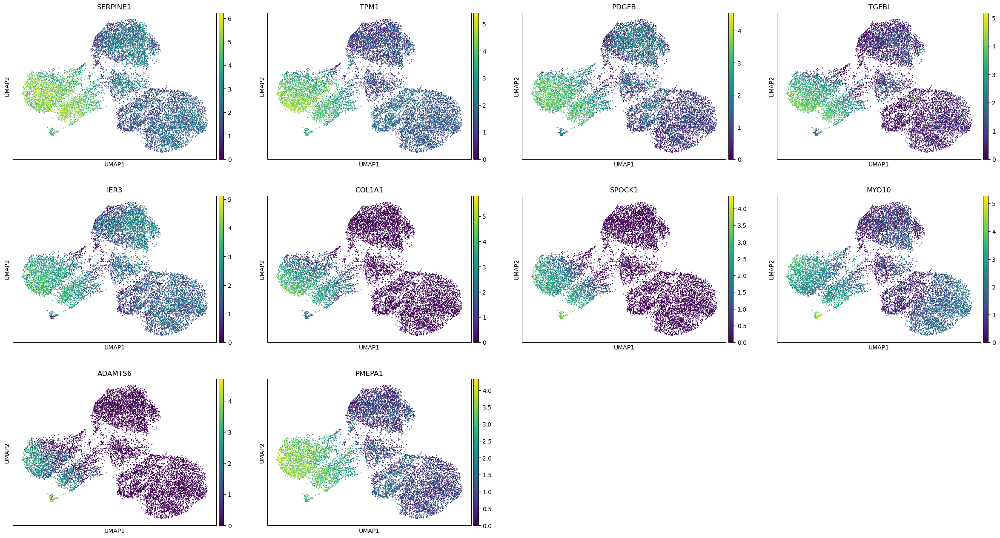

In [51]:
sc.pl.umap(bdata, color=gene_names_list)

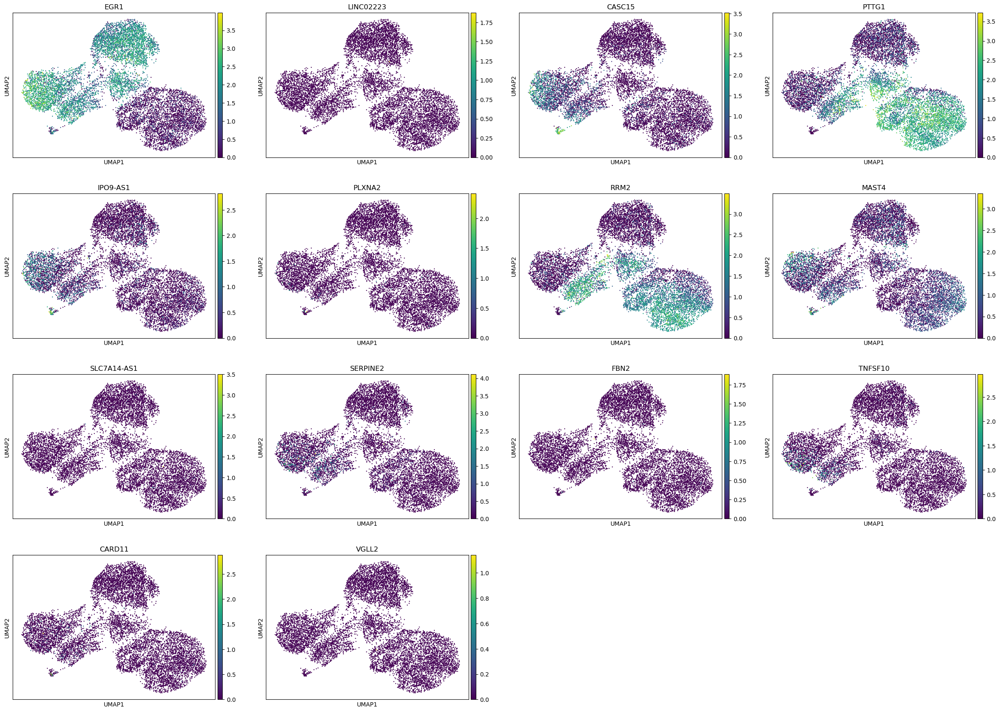

In [80]:
sc.pl.umap(bdata, color=gene_names_list2)

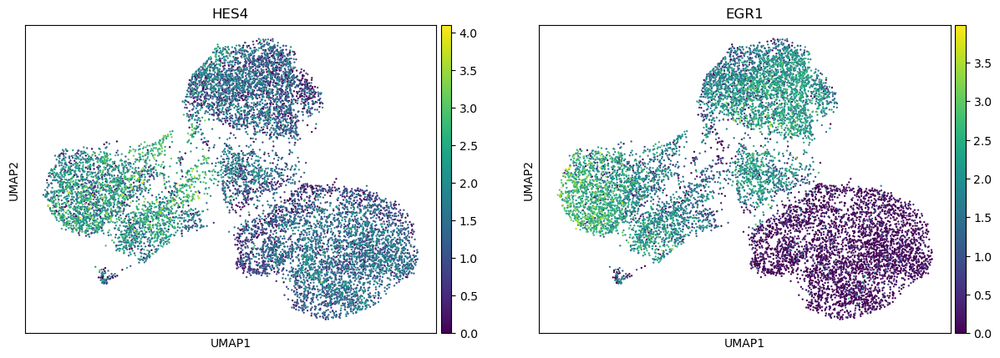

In [128]:
sc.pl.umap(bdata, color=['HES4','EGR1'])

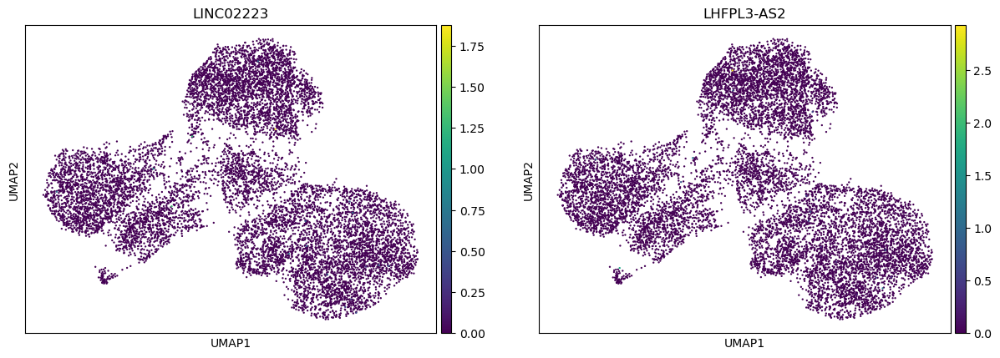

In [258]:
sc.pl.umap(bdata, color=['LINC02223','LHFPL3-AS2'])

In [ ]:
'TPX2','TOP2A','CDK1','BIRC5'.'CLSPN'


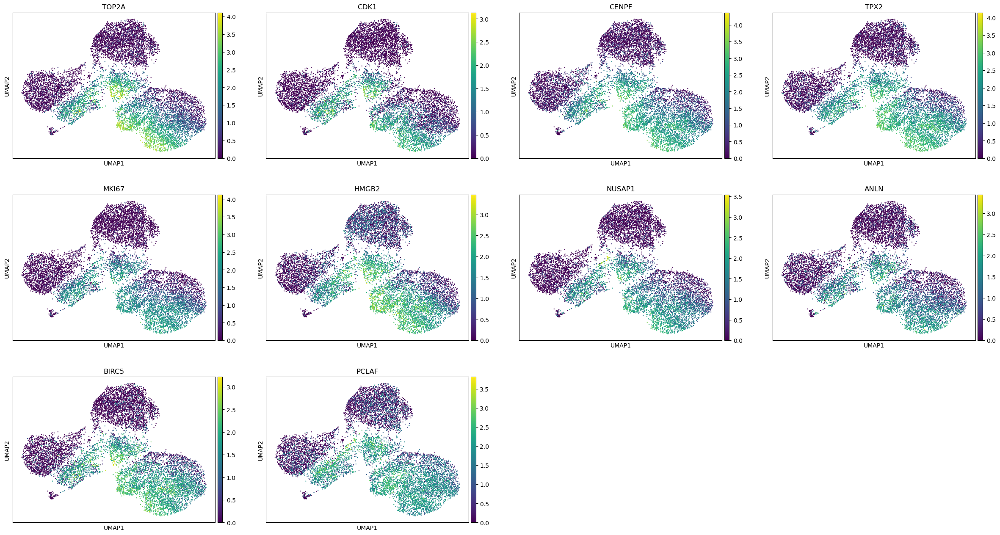

In [163]:
sc.pl.umap(adata, color=['TOP2A', 'CDK1', 'CENPF', 'TPX2', 'MKI67', 'HMGB2', 'NUSAP1', 'ANLN', 'BIRC5',
 'PCLAF'])

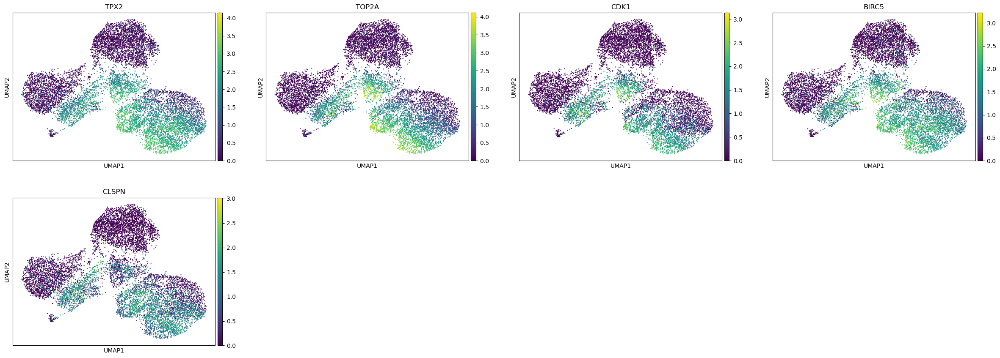

In [140]:
sc.pl.umap(adata, color=['TPX2','TOP2A','CDK1','BIRC5','CLSPN'])

In [ ]:
`PTTG1‘, ‘TPX2‘, ‘TOP2A‘, ‘MT1A‘, ‘MT2A‘ , ‘KRT18‘, `KRT8`,`SDK1`,`PPP1R14A`,`MT1E`


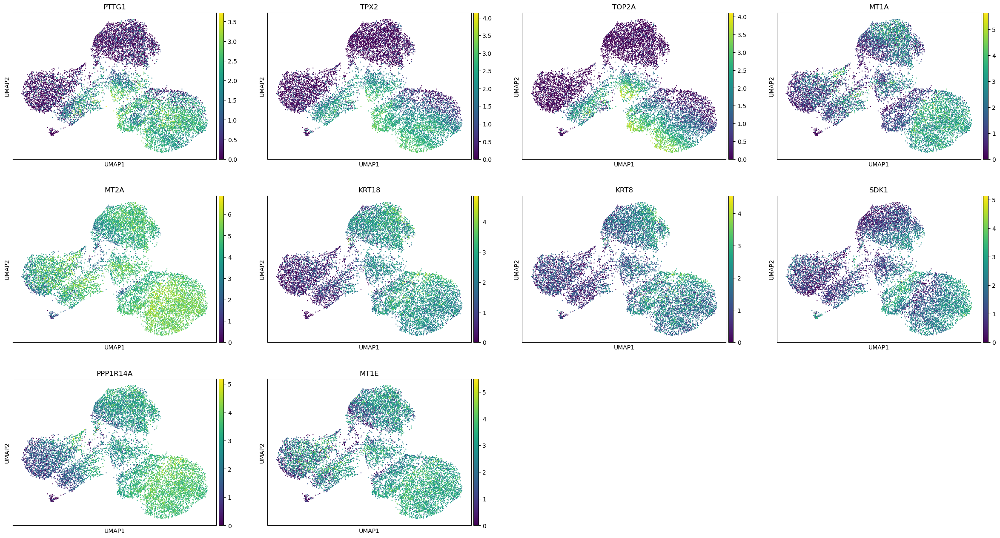

In [141]:
sc.pl.umap(adata, color=['PTTG1', 'TPX2', 'TOP2A', 'MT1A', 'MT2A' , 'KRT18', 'KRT8','SDK1','PPP1R14A','MT1E'])

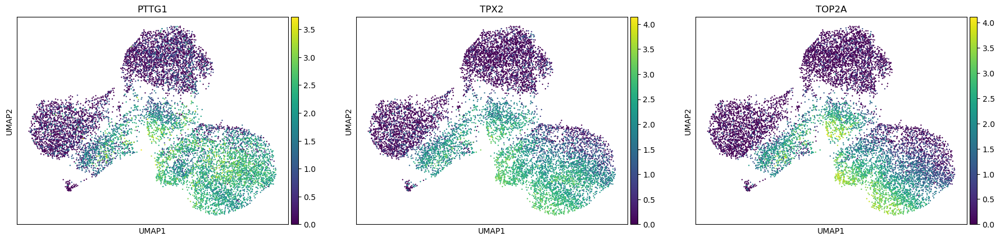

In [142]:
sc.pl.umap(adata, color=['PTTG1', 'TPX2', 'TOP2A'])

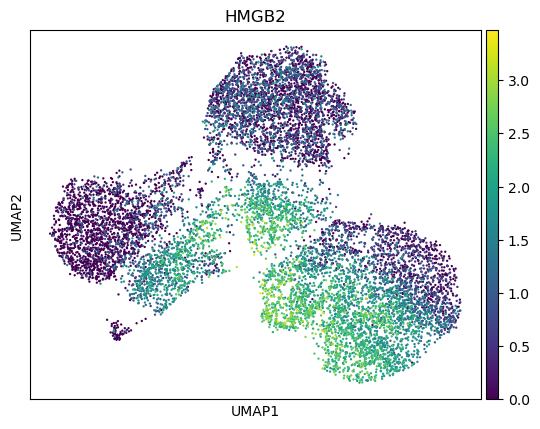

In [164]:
sc.pl.umap(adata, color=['HMGB2'])

#https://www.db-thueringen.de/servlets/MCRFileNodeServlet/dbt_derivate_00054458/cancers-13-04877.pdf
#https://pubmed.ncbi.nlm.nih.gov/35711974/
#https://www.oncotarget.com/article/22494/text/

In [ ]:
'CENPF','H2AZ1','HMGB2','PTTG1','ANLN','HMMR','RRM2','KIF2C','CKS2','SGO2','ASPM','CDCA8'

In [ ]:
'RRM2','H2AZ1','ANLN','CLSPN','PTTG1'	

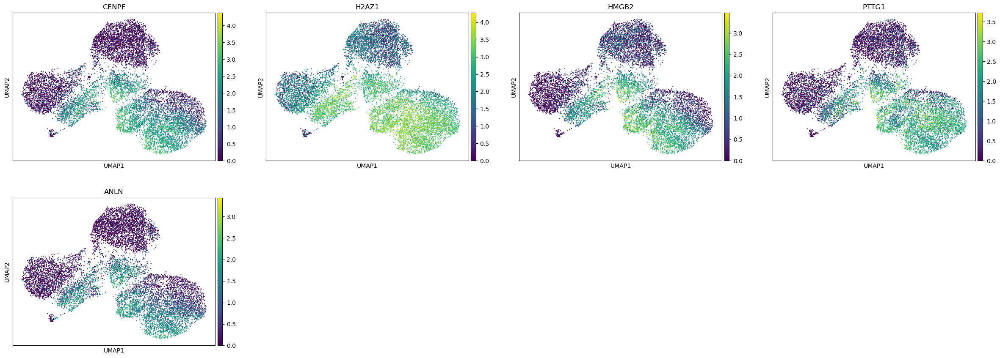

In [150]:
sc.pl.umap(adata, color=['CENPF','H2AZ1','HMGB2','PTTG1','ANLN'])

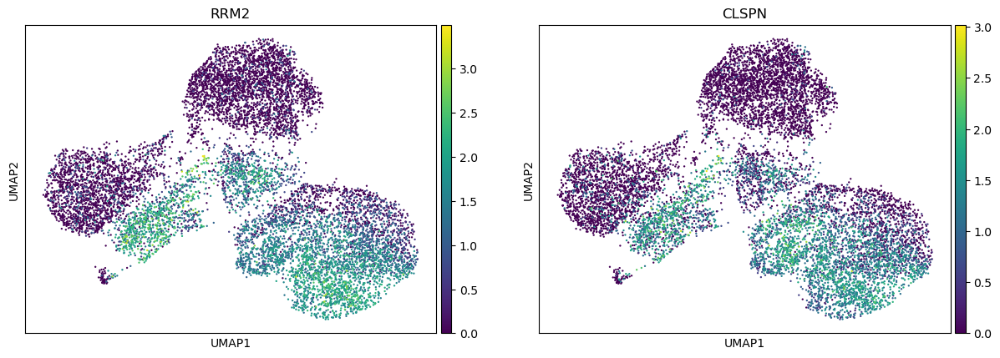

In [152]:
sc.pl.umap(adata, color=['RRM2','CLSPN'])

# Testing

## Varify gene index, gene name, and expression in PFA_data and oriinal adata file. 

#### Potential mismatch

In [ ]:
# in this code above the list_variables that queried to the data objects
# maybe here there is a mismatch
X_train= data[list_variables, :].transpose()

#### Get the genes of interest

In [24]:
# Gene recommendation from PFA and mutual information
genes_mutual_information_label=pd.read_csv('/home2/lumpi/Projects/single-cell_samantha/data/gene_mutual_information.csv').iloc[0:,:]
selected_genes=genes_mutual_information_label[genes_mutual_information_label["mutual information"]>threshold_mutual_information] # Take the genes with more mutual information than the threshold
selected_genes = selected_genes.iloc[0:10,:]
list_variables=sorted(list(selected_genes["index feature"])) # List of indices of the rows that are to be taken from the data file and correspond to the selected features
list_variables = list_variables

In [25]:
selected_genes

,index feature,mutual information,gene_names
0,525,0.751974,TGFBI
1,526,0.708558,SPOCK1
2,719,0.670917,SERPINE1
3,492,0.575607,ADAMTS6
4,467,0.526202,MYO10
5,570,0.490800,SOX4
6,629,0.486788,MARCKS
7,123,0.485984,NAV1
8,520,0.468442,LOX
9,547,0.449390,ADAM19


In [26]:
list_variables

[123, 467, 492, 520, 525, 526, 547, 570, 629, 719]

#### Data of interest

In [428]:
path="/home2/lumpi/Projects/single-cell_samantha/data/PFA_analysis_data.csv"
number_sweeps=10
gene_selection=0 # validate on PFA = 0, random genes = 1 or all genes = 2


data_total=pd.read_csv(path, sep=",", header=None).transpose()

## here read correctly
data=data_total.sample(frac = 0.8)
data_test=data_total.drop(data.index)
data=data.transpose().to_numpy()
data_test=data_test.transpose().to_numpy()
data[0:2,0:20]

array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 1.        ,
        1.        , 0.        , 1.        , 0.        , 0.        ],
       [2.58530855, 1.33284819, 0.        , 1.6021167 , 1.6265732 ,
        2.45020056, 2.41849017, 0.85693824, 0.85954708, 1.71424603,
        0.71659088, 0.78546333, 1.86333477, 1.66820693, 2.84883308,
        3.75645995, 1.45667851, 2.58357763, 0.81300777, 0.92066532]])

In [429]:
data_total

,0,1,2,3,4,5,6,7,8,9,...,1606,1607,1608,1609,1610,1611,1612,1613,1614,1615
0,0.0,1.583742,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,3.963516
1,0.0,1.817618,0.0,2.106576,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,3.207734
2,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.291329,0.0,0.0,0.0,0.000000,4.121720
3,0.0,1.823131,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.712088,0.0,0.0,0.0,0.712088,4.241672
4,0.0,1.036066,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.646608,0.0,0.0,0.0,0.000000,4.065095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3723,1.0,3.952191,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,4.907056
3724,1.0,1.624724,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.624724,0.0,0.0,0.0,1.962280,3.515007
3725,1.0,0.896253,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.896253,0.0,0.0,0.0,0.896253,4.477613
3726,1.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.242907,0.0,0.0,0.0,0.000000,4.970865


In [430]:
data_test

array([[0.        , 0.        , 0.        , ..., 1.        , 1.        ,
        1.        ],
       [1.81761813, 1.21865022, 0.82830292, ..., 2.59750414, 2.29551053,
        2.08552837],
       [0.        , 0.        , 0.        , ..., 1.51545227, 1.38040233,
        1.20884526],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.78449929, 0.        , ..., 1.0209173 , 0.        ,
        1.74033093],
       [3.20773435, 4.8274827 , 3.64788747, ..., 4.5735755 , 4.87120295,
        4.5286665 ]])

In [431]:
list_variables = list_variables[1]
list_variables

468

In [440]:
X_train= data[list_variables, :].transpose()
scaler = preprocessing.MinMaxScaler().fit(X_train)
X_train_scaled=scaler.transform(X_train)
y_train=data[0,:]
X_test= data_test[list_variables, :].transpose()
X_test_scaled=scaler.transform(X_test)
y_test=data_test[0,:]

In [443]:
y_test

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [442]:
X_test[:,1]

array([1.40959704, 0.78449929, 0.        , 0.        , 0.        ,
       0.64743048, 0.49378771, 0.75188708, 1.03754187, 0.54274738,
       0.74553502, 0.        , 0.67454588, 0.98727751, 0.92890036,
       0.92127168, 0.        , 0.        , 0.        , 0.89598942,
       0.88836211, 1.19212472, 0.75724202, 0.94422674, 0.        ,
       0.57783091, 0.        , 0.73509729, 0.        , 0.        ,
       0.        , 1.54801464, 0.72266006, 0.76752889, 0.        ,
       0.        , 1.24603868, 0.86168683, 1.22028732, 0.47501543,
       0.        , 0.        , 0.94575471, 0.9021033 , 0.72137642,
       1.10044408, 0.        , 0.92949462, 0.        , 0.        ,
       0.        , 0.82744759, 0.        , 1.2387166 , 2.13118267,
       0.        , 1.21968365, 1.2656914 , 0.        , 0.85042989,
       0.        , 2.31013703, 0.        , 0.        , 1.78947759,
       0.59342164, 1.92027521, 0.        , 1.65983462, 1.008901  ,
       1.53069079, 1.46292222, 0.        , 0.        , 0.     

In [21]:
import pandas as pd
import numpy as np

# Assuming y_test and X_test[:,1] are numpy arrays
# Create a DataFrame from y_test and X_test[:,1]
data = pd.DataFrame({
    'y_test': y_test,
    'X_test_1': X_test[:,1]  # Assuming this is the column you're interested in
})

# Group by 'y_test' and calculate the average for 'X_test_1' in each group
grouped_averages = data.groupby('y_test')['X_test_1'].mean()

print(grouped_averages)

NameError: name 'y_test' is not defined

In [ ]:
## might indicate mismatch as this is not the number for LINC but MYO